# Exploratory Data Analysis for Used Car sales features and its impact on price


# What is Used Car Pricing Problem?

Customer looking for used car will always try to get maximize features within affordability. Based on consumer's personal equestion, he/she has list of must have features and optional features in used cars at the sametime considering affordability equation as well. I find buying a used car is hardest decision to make compare to buying a new car.  

For this problem, Used car dealer want to understand what all features drives the price of a used car.  Dealer also wants to understand features that are most valuble to buyer of a used car. The dataset given to us has no consumer demographic information. Hence, we can analyze the features and price correlationship and see how we can connect that analysis to consumer.  First we need to explore the data and see what all information is available to us.


## Standard package imports

In [136]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
#matplotlib.style.use("Solarize_Light2")
matplotlib.style.use("ggplot")

%matplotlib inline

# Common Plot Functions



In [137]:
def plot_boxh_groupby(df, feature_name, by):
    """
    Box plot with groupby
    
    df: DataFrame
    feature_name: Name of the feature to be plotted
    by: Name of the feature based on which groups are created
    """
    df.boxplot(column=feature_name, by=by, vert=False, 
                              figsize=(10, 6))
    plt.title(f'Distribution of {feature_name} by {by}')
    plt.show()
    

def plot_hist(df, feature_name, kind='hist', bins=100, log=True):
    """
    Plot histogram.
    
    df: DataFrame
    feature_name: Name of the feature to be plotted.
    """
    if log:
        df[feature_name].apply(np.log1p).plot(kind='hist', 
                                              bins=bins, 
                                              figsize=(15, 5), 
                                              title=f'Distribution of log1p[{feature_name}]')
    else:
        df[feature_name].plot(kind='hist', 
                              bins=bins, 
                              figsize=(15, 5), 
                              title=f'Distribution of {feature_name}')
    plt.show()


def plot_ts(series, figsize=(20, 6), title=None, xlabel="", ylabel=""):
    """
    Plot Time Series data. The series object should have date or time as index.
    
    series: Series object to be plotted.
    """
    series.plot(figsize=figsize, title=title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()


def plot_barh(df, feature_name, normalize=True, 
              kind='barh', figsize=(15,5), sort_index=False, title=None):
    """
    Plot barh for a particular feature
    
    kind : Type of the plot
    
    """
    if sort_index==True:
        df[feature_name].value_counts(
                normalize=normalize, dropna=False).sort_index().plot(
                kind=kind, figsize=figsize, grid=True,
                title=title)
    else:   
        df[feature_name].value_counts(
                normalize=normalize, dropna=False).sort_values().plot(
                kind=kind, figsize=figsize, grid=True,
                title=title)
    
    plt.legend()
    plt.show()


def plot_barv(df,xi,yi,ititle):
    fig = px.bar(df, x=xi, y=yi,title=ititle)
    fig.show()

def plot_line(df,xi,yi,ititle):
    fig = px.line(df, x=xi, y=yi,title=ititle)
    fig.show()

def plot_boxh(df, feature_name, kind='box', log=True):
    """
    Box plot
    """
    if log:
        df[feature_name].apply(np.log1p).plot(kind='box', vert=False, 
                                                  figsize=(10, 6), 
                                                  title=f'Distribution of log1p[{feature_name}]')
    else:
        df[feature_name].plot(kind='box', vert=False, 
                              figsize=(10, 6), 
                              title=f'Distribution of {feature_name}')
    plt.show()
    

def plot_scatter(df, feature_x, feature_y, figsize=(10,10), 
                 title=None, xlabel=None, ylabel=None):
    """
    Plot satter     
    """
    df.plot.scatter(feature_x, feature_y, 
                    figsize=(8, 6), title=title, 
                    legend=None)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Data Description

There is only 1 CSV file provided containing vehicle data. 
Looking at this dataset, dataset contains more categorical attributes compare to continuoys or numerical attributes. These attributes can be grouped based on
1) Geographic 
   - Region
   - State
2) Ownership
      - Title Status
3) Manufacture and Model
      - Manufaturer
      - Model
4) Core features of the car
      - Price
      - year
      - titel status
      - vin (grouping purpose)
      - condition
      - cylinders
      - fuel
      - odometer
      - transmission
      - drive
      - size
      - type
      - paint_color

In real-life above all factors can affect the overall price of used car. I think Geographic, ownership/vin and Manufacture/Model information will all too much categorical and can increase the complexity of model by adding unnessary dimensionality.
For this study, i want to focus on core features of the car which directly incluences the price of the car. Next step is to prepare the dataset around using "core feartures of the used car".  lets see how the fidelity of data maintains. If it drops the records drastically, we need to comeup with different approch.



In [138]:
# Read the data and prepare the dataframe containing core features of the used car
DATA_DIR = "./data"

orig_vehicles_df = pd.read_csv(f"{DATA_DIR}/vehicles.csv")

print("total records = ",orig_vehicles_df.size)
print("No of vehicles=",orig_vehicles_df.value_counts('VIN').shape)



total records =  7683840
No of vehicles= (118246,)



# Data breakdown

   - total no fo records -426880    with unique vehicles of = 118246

   - we can not apply dropna at this stage because it will reduce the size of recordset drastically.

Next step :  Lets merge rows or drop duplicate rows based on VIN. We will use core attributes of used car to indentify duplicate rows.

   

In [139]:

# drop duplicate rows based on specific columns
drop_dupe_by_core_attr= orig_vehicles_df.drop_duplicates(subset=['VIN','title_status','price','year', 'condition','cylinders', 'fuel', 'odometer','transmission','drive', 'size', 'type', 'paint_color'])
print("No of records after dupes drop=",drop_dupe_by_core_attr.shape)

drop_dupe_by_veh= drop_dupe.drop_duplicates(subset=['VIN'])
print("No of records after dupes drop=",drop_dupe_by_veh.shape)

No of records after dupes drop= (245226, 18)
No of records after dupes drop= (118247, 18)


# Results of duplicates

Identifying duplicates will be two step process. 
- Step 1 - First we apply "all core attributes of used cars" as duplicate rule. That way will have dataframe having all attributes carrying values.
- Step 2 - Secondly, apply duplicates rule based on VIN on the Step1 output.

So, this dataset carries 118427 clean vehicle records.

Next step... check for NAN...

In [140]:
# build dataframe containing core vehicles attributes

veh_core_features_df=drop_dupe_by_veh[['VIN','title_status','price', 'year', 'condition','cylinders', 'fuel', 'odometer','transmission','drive', 'size', 'type', 'paint_color']]

#veh_core_features_df.info()
print("---  non NAN values by column---")
print("paint_color",veh_core_features_df['paint_color'].isna().sum())
print("type",veh_core_features_df['type'].isna().sum())
print("size",veh_core_features_df['size'].isna().sum())
print("drive",veh_core_features_df['drive'].isna().sum())
print("transmission",veh_core_features_df['transmission'].isna().sum())
print("odometer",veh_core_features_df['odometer'].isna().sum())
print("fuel",veh_core_features_df['fuel'].isna().sum())
print("cylinders",veh_core_features_df['cylinders'].isna().sum())
print("condition",veh_core_features_df['condition'].isna().sum())
print("VIN",veh_core_features_df['VIN'].isna().sum())
print("year",veh_core_features_df['year'].isna().sum())

---  non NAN values by column---
paint_color 30683
type 16185
size 87937
drive 27349
transmission 1237
odometer 1576
fuel 1639
cylinders 47981
condition 57165
VIN 1
year 594


In [141]:
#  Check for NAN values and drop those records
vehicles_clean = veh_core_features_df.dropna()

print("No of clean vehicles records=",vehicles_clean.shape)

vehicles_clean.head()

No of clean vehicles records= (22560, 13)


,VIN,title_status,price,year,condition,cylinders,fuel,odometer,transmission,drive,size,type,paint_color
126,1GCWGAFP8J1309579,clean,0,2018.0,like new,6 cylinders,gas,68472.0,automatic,rwd,full-size,van,white
127,1GCWGAFP4K1214373,clean,0,2019.0,like new,6 cylinders,gas,69125.0,automatic,rwd,full-size,van,white
128,1GCWGAFPXJ1337903,clean,0,2018.0,like new,6 cylinders,gas,66555.0,automatic,rwd,full-size,van,white
215,JTDBT123520243495,clean,4000,2002.0,excellent,4 cylinders,gas,155000.0,automatic,fwd,compact,sedan,blue
219,WBAHD6322SGK86772,clean,2500,1995.0,fair,6 cylinders,gas,110661.0,automatic,rwd,mid-size,sedan,white


# Total clean vehicles record 22560 out of 118246.  It feels like we are loosing good amount of information when we applied dropna.

# Data Exploration

### No Cars by cylinders

-  4,6 and 8 cylinders cars are most popular used car

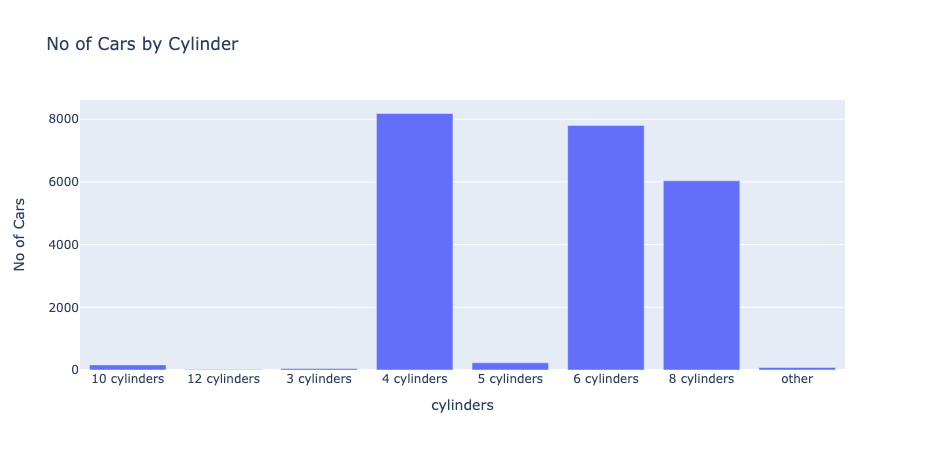

In [142]:
#  on of vehicles by cylinders
veh_by_cylinder= vehicles_clean.groupby('cylinders')['VIN'].count().to_frame('No of Cars').reset_index()
plot_barv(veh_by_cylinder,'cylinders','No of Cars','No of Cars by Cylinder')


### No of cars by transmission
    -  Automatic transmission is highest sold used car
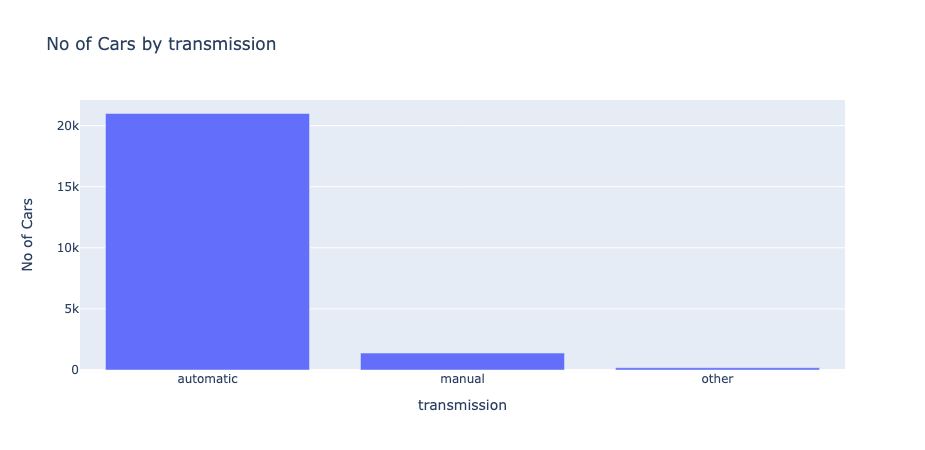

In [143]:
#  no of vehicles by transmission type
veh_by_trans= vehicles_clean.groupby('transmission')['VIN'].count().to_frame('No of Cars').reset_index()
plot_barv(veh_by_trans,'transmission','No of Cars','No of Cars by transmission')

### Aging of used cars conisdering car is still operative today vs price

-   Oldest Used Car  118.0
-   Newest Used Car  1.0
-   Highest Used Car  167500
-   Lowest Used Car  0


In [144]:
# calculate age of the used car
vehicles_clean['age']= 2023 - vehicles_clean.year
print('Oldest Used Car ', vehicles_clean['age'].max())
print('Newest Used Car ', vehicles_clean['age'].min())
print('Highest Used Car Price ', vehicles_clean['price'].max())
print('Lowest Used Car Price ', vehicles_clean['price'].min())
#plot_line(vehicles_clean,'age','price','Used Car Age vs Price')



Oldest Used Car  118.0
Newest Used Car  1.0
Highest Used Car Price  167500
Lowest Used Car Price  0


/var/folders/bq/l5kf6bvd6n912l8l_7_pqycc0000gn/T/ipykernel_16338/2362400131.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Why the price of used car is zero?  Does it has title issue?

Most of the used car having zero price has clean title. Looks like data issue . Lets remove records with price equal to zero.

    title_status    Count
-   clean           1234
-   rebuilt         2
-   salvage         1

In [148]:
vehicles_zero_price = vehicles_clean.query("price == 0").groupby("title_status")['title_status'].count()
vehicles_zero_price

title_status
clean      1234
rebuilt       2
salvage       1
Name: title_status, dtype: int64

###  Convert cylinder attributes to numerical value

In [174]:
vehicles_clean['cylinders'] = vehicles_clean['cylinders'].replace('6 cylinders',6).replace('4 cylinders',4).replace('8 cylinders',8).replace('10 cylinders',10).replace('5 cylinders',5).replace('3 cylinders',3)
vehicles_clean = vehicles_clean.query("cylinders != 'other'")
vehicles_clean= vehicles_clean.query("transmission != 'other'")
vehicles_clean= vehicles_clean.query("type != 'other'")
vehicles_clean.shape

(22220, 14)

# convert categorial columns using one hot encoding

In [173]:
vehicles_clean.value_counts('transmission')

transmission
automatic    20930
manual        1381
Name: count, dtype: int64

In [176]:

# drop VIN and title_status columns
vehicles_final = vehicles_clean[['VIN','price','year', 'condition','cylinders', 'fuel', 'odometer','transmission','drive', 'size', 'type', 'paint_color','age']]
one_hot_condition = pd.get_dummies(vehicles_clean['condition'],dtype=float)
vehicles_final= vehicles_final.join(one_hot_condition)
one_hot_fuel = pd.get_dummies(vehicles_clean['fuel'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_fuel)

one_hot_transmission = pd.get_dummies(vehicles_clean['transmission'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_transmission)
one_hot_drive = pd.get_dummies(vehicles_clean['drive'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_drive)

one_hot_size = pd.get_dummies(vehicles_clean['size'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_size)
one_hot_type = pd.get_dummies(vehicles_clean['type'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_type)

one_hot_paint_color = pd.get_dummies(vehicles_clean['paint_color'],dtype=float)
vehicles_final=vehicles_final.join(one_hot_paint_color)

vehicles_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22220 entries, 126 to 426833
Data columns (total 57 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   VIN           22220 non-null  object 
 1   price         22220 non-null  int64  
 2   year          22220 non-null  float64
 3   condition     22220 non-null  object 
 4   cylinders     22220 non-null  object 
 5   fuel          22220 non-null  object 
 6   odometer      22220 non-null  float64
 7   transmission  22220 non-null  object 
 8   drive         22220 non-null  object 
 9   size          22220 non-null  object 
 10  type          22220 non-null  object 
 11  paint_color   22220 non-null  object 
 12  age           22220 non-null  float64
 13  excellent     22220 non-null  float64
 14  fair          22220 non-null  float64
 15  good          22220 non-null  float64
 16  like new      22220 non-null  float64
 17  new           22220 non-null  float64
 18  salvage       22220 non-null

In [179]:
vehicles_final.columns
vehicles_final=vehicles_final[['VIN', 'price', 'year', 'cylinders', 'odometer','age','excellent', 'fair', 'good', 'like new', 'new', 'salvage', 'diesel','electric', 'gas', 'hybrid', 'other', 'automatic', 'manual', '4wd',
       'fwd', 'rwd', 'compact', 'full-size', 'mid-size', 'sub-compact', 'SUV',
       'bus', 'convertible', 'coupe', 'hatchback', 'mini-van', 'offroad',
       'pickup', 'sedan', 'truck', 'van', 'wagon', 'black', 'blue', 'brown',
       'custom', 'green', 'grey', 'orange', 'purple', 'red', 'silver', 'white',
       'yellow']]



Index(['VIN', 'price', 'year', 'cylinders', 'odometer', 'age', 'excellent',
       'fair', 'good', 'like new', 'new', 'salvage', 'diesel', 'electric',
       'gas', 'hybrid', 'other', 'automatic', 'manual', '4wd', 'fwd', 'rwd',
       'compact', 'full-size', 'mid-size', 'sub-compact', 'SUV', 'bus',
       'convertible', 'coupe', 'hatchback', 'mini-van', 'offroad', 'pickup',
       'sedan', 'truck', 'van', 'wagon', 'black', 'blue', 'brown', 'custom',
       'green', 'grey', 'orange', 'purple', 'red', 'silver', 'white',
       'yellow'],
      dtype='object')

## Correlation Matrix - Core Used car attributes ( Age, Mileage, cyclinders)

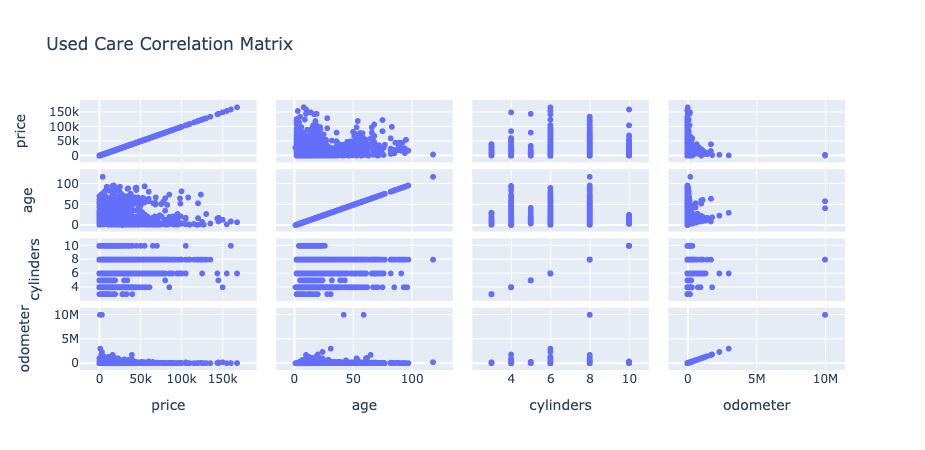

Age and milage of the car has tight correlation with price

In [185]:
# core correlation matrix
fig = px.scatter_matrix(vehicles_final[['price','age','cylinders','odometer']],title='Used Care Correlation Matrix')
fig.show()

## Correlation Matrix -  Engine attributes of used car

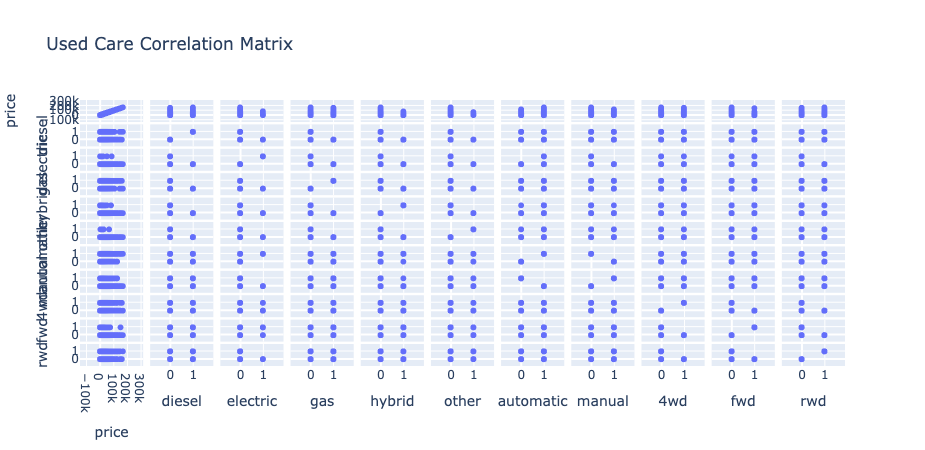

Based on this correlation matrix , i see moderate impact on car price based on this dataset. 

In [187]:
# engine attributes correlation matrix
fig = px.scatter_matrix(vehicles_final[['price','diesel','electric', 'gas', 'hybrid', 'other', 'automatic', 'manual', '4wd',
       'fwd', 'rwd']],title='Used Care Correlation Matrix -  Engine')
fig.show()



## Correlation Matrix -  Type of Cars

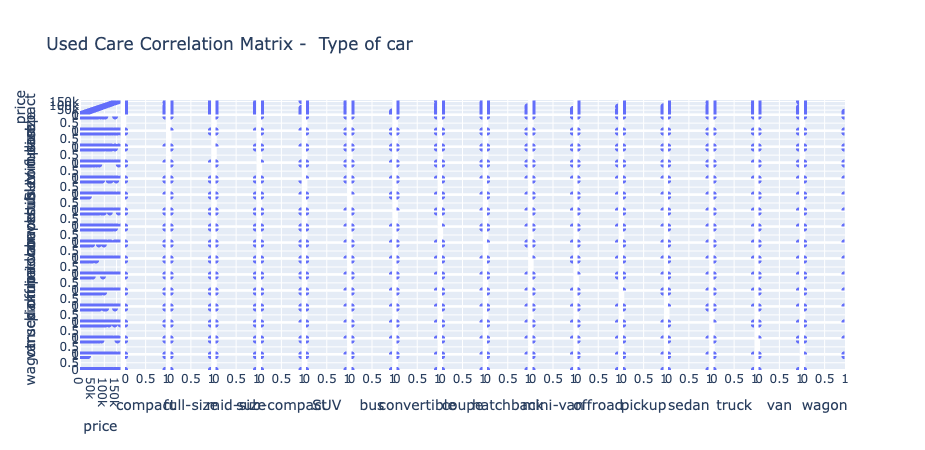

In [189]:

# Used car type attributes correlation matrix
fig = px.scatter_matrix(vehicles_final[['price','compact', 'full-size', 'mid-size', 'sub-compact', 'SUV',
       'bus', 'convertible', 'coupe', 'hatchback', 'mini-van', 'offroad',
       'pickup', 'sedan', 'truck', 'van', 'wagon']],title='Used Care Correlation Matrix -  Type of car')
fig.show()



## Correlation Matrix - Cosemetic Attributes

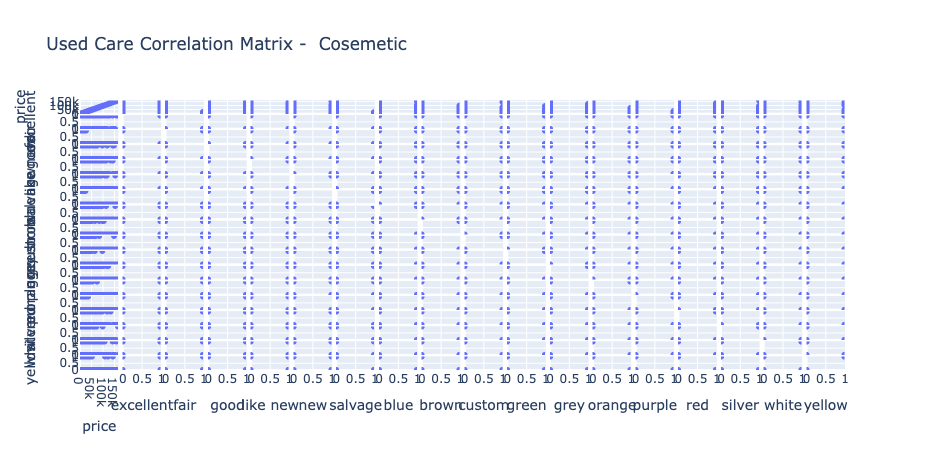

In [191]:
# Cosemetic attributes correlation matrix
fig = px.scatter_matrix(vehicles_final[['price','excellent', 'fair', 'good', 'like new', 'new', 'salvage','blue', 'brown',
       'custom', 'green', 'grey', 'orange', 'purple', 'red', 'silver', 'white',
       'yellow']],title='Used Care Correlation Matrix -  Cosemetic')
fig.show()